# **Fase 1 | Avance de Proyecto**

Integrantes
- Renata Díaz Barreiro Castro
- Victor Arista Beltrán
- Juan Carlos Campero Villa
- Jonathan Puga
- Luis Miguel


En esta actividad, los estudiantes deberán demostrar sus capacidades en diversas etapas del desarrollo de proyectos de Machine Learning. La actividad está estructurada para abarcar desde la manipulación y preparación de datos hasta la construcción y evaluación de modelos, así como la aplicación de principios de programación orientada a objetos para conseguir que el código sea mantenible.

# **THE DATA BASE: RESIDENCIAL BUILDINGS**

Data set includes construction cost, sale prices, project variables, and economic variables corresponding to real estate single-family residential apartments in Tehran, Iran.

LINK: https://archive.ics.uci.edu/dataset/437/residential+building+data+set

In [38]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
pd.set_option('display.max_rows', None) #se muestren todas las filas
pd.set_option('display.max_columns', None)

# **Manipulación y preparación de datos**

Tarea:
Realizar tareas de manipulación y preparación de datos utilizando herramientas y bibliotecas específicas.

Instrucciones:

Importar los conjuntos de datos con los que se trabajará.
Realizar tareas de limpieza de datos, eliminando valores nulos o inconsistentes.
Realizar transformaciones necesarias para preparar los datos para el análisis y modelado.
Importancia: Esta fase es crucial para asegurar que los datos estén en un formato adecuado y limpio, lo que es esencial para la construcción de modelos precisos y fiables.

In [1]:
residencial_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MNA /9 Operaciones Automaticas MLOPS/SEMANA 4 30 al 6 octubre Best practices | Desarrollo/residencial_data.csv')

NameError: name 'pd' is not defined

In [42]:
# Si 'residencial_df' es tu DataFrame, lo guardamos como CSV
residencial_df.to_csv('residencial_df.csv', index=False)

# Descargar el archivo a tu computadora
from google.colab import files
files.download('residencial_df.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [43]:
residencial_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 372 entries, 0 to 371
Columns: 109 entries, START YEAR to V-10
dtypes: float64(104), int64(5)
memory usage: 316.9 KB


In [44]:
residencial_df.head()

,START YEAR,START QUARTER,COMPLETION YEAR,COMPLETION QUARTER,V-1,V-2,V-3,V-4,V-5,V-6,V-7,V-8,V-11,V-12,V-13,V-14,V-15,V-16,V-17,V-18,V-19,V-20,V-21,V-22,V-23,V-24,V-25,V-26,V-27,V-28,V-29,V-11.1,V-12.1,V-13.1,V-14.1,V-15.1,V-16.1,V-17.1,V-18.1,V-19.1,V-20.1,V-21.1,V-22.1,V-23.1,V-24.1,V-25.1,V-26.1,V-27.1,V-28.1,V-29.1,V-11.2,V-12.2,V-13.2,V-14.2,V-15.2,V-16.2,V-17.2,V-18.2,V-19.2,V-20.2,V-21.2,V-22.2,V-23.2,V-24.2,V-25.2,V-26.2,V-27.2,V-28.2,V-29.2,V-11.3,V-12.3,V-13.3,V-14.3,V-15.3,V-16.3,V-17.3,V-18.3,V-19.3,V-20.3,V-21.3,V-22.3,V-23.3,V-24.3,V-25.3,V-26.3,V-27.3,V-28.3,V-29.3,V-11.4,V-12.4,V-13.4,V-14.4,V-15.4,V-16.4,V-17.4,V-18.4,V-19.4,V-20.4,V-21.4,V-22.4,V-23.4,V-24.4,V-25.4,V-26.4,V-27.4,V-28.4,V-29.4,V-9,V-10
0,81.0,1.0,85.0,1.0,1.0,3150.0,920.0,598.5,190.0,1010.84,16.0,1200.0,6713.00,56.2,61.52,6.11,320957.30,3485.8,64.5,239.50,12456.6,15,797.3,809.8,1755.00,8003.0,67.81,63.25,3758.77,42587.00,628132.9,4986.0,55.5,60.78,3.94,297210.1,3663.5,61.50,179.63,9342.45,15,757.800000,861.80,1755.00,8018.0,65.00,60.53,3538.71,31940.25,610502.7,6788.0,54.2,59.40,5.41,280451.7,3755.8,58.10,119.75,6228.30,15,795.000000,818.50,1755.00,8001.0,63.69,58.55,3347.72,21293.5,589389.6,5728.0,52.4,57.65,5.40,262789.00,2931.4,54.20,59.88,3114.15,15,746.800000,815.50,1755.00,8013.0,62.78,56.45,3387.72,10646.75,606524.2,7196.0,51.3,56.13,5.97,249110.70,2562.3,52.80,217.00,10445.6,15,733.800000,815.50,1755.00,8002.0,60.74,54.26,2978.26,41407.0,601988.1,2200.0,410.0
1,84.0,1.0,89.0,4.0,1.0,7600.0,1140.0,3040.0,400.0,963.81,23.0,2900.0,3152.00,106.0,103.03,3.15,685697.50,3526.1,105.5,208.80,17584.3,15,1408.4,1473.5,8842.18,8864.0,105.52,105.32,12113.01,45966.00,1188995.8,2700.0,103.0,101.84,2.65,625829.2,4386.9,100.40,156.60,13188.23,15,1424.100000,1584.30,8776.71,8799.0,101.00,101.89,13571.80,34474.50,1067772.0,3561.0,98.2,98.64,2.76,602224.7,3819.0,97.20,104.40,8792.15,15,1298.800000,1389.60,8699.73,8735.0,98.12,98.45,13596.37,22983.0,973523.7,3157.0,92.8,96.49,3.05,552124.40,3896.7,96.90,52.20,4396.08,15,1294.200000,1288.00,8555.54,8585.0,95.35,94.34,12063.50,11491.50,954628.6,3678.0,86.2,83.21,3.25,526596.40,2790.6,94.10,334.80,14488.6,15,1143.800000,1316.30,8364.78,8393.0,90.95,89.79,11379.37,44835.0,929027.1,5000.0,1000.0
2,78.0,1.0,81.0,4.0,1.0,4800.0,840.0,480.0,100.0,689.84,15.0,630.0,1627.00,41.0,41.25,1.74,160401.50,1217.5,34.4,285.80,6489.1,15,614.0,608.2,1755.00,7773.0,45.91,38.34,1537.96,39066.00,524764.8,1580.0,40.3,40.84,1.15,150266.8,1149.5,34.10,214.35,4866.83,15,573.726531,680.29,1755.00,6714.0,43.40,36.45,1535.16,29299.50,466212.2,2628.0,39.3,40.21,1.52,143737.7,1284.5,33.50,142.90,3244.55,15,554.081966,663.97,1755.00,5827.0,41.79,34.76,1527.55,19533.0,409677.9,2374.0,38.0,39.43,0.92,134548.40,1191.1,33.70,71.45,1622.28,15,574.600000,680.50,1755.00,5565.0,41.03,33.37,1601.79,9766.50,403875.0,2693.0,36.2,37.64,1.55,134312.50,1529.0,31.43,175.70,3994.7,15,589.500000,765.80,1755.00,4930.0,38.70,32.04,1653.06,37933.0,377828.6,1200.0,170.0
3,72.0,2.0,73.0,2.0,1.0,685.0,202.0,13.7,20.0,459.54,4.0,140.0,2580.93,12.1,10.03,1.24,38193.64,287.2,13.6,17.03,154.4,12,183.6,211.1,1612.95,1649.0,11.62,10.06,392.96,8435.75,141542.6,2952.0,11.6,8.50,1.99,35859.4,322.5,12.67,56.60,610.40,12,165.100000,208.60,1504.36,1582.0,10.86,9.79,435.10,32776.00,129102.4,2649.0,11.4,6.97,2.25,32793.7,388.9,11.73,42.45,457.80,12,167.900000,209.60,1450.47,1507.0,10.17,9.35,508.64,24582.0,123618.0,2312.0,10.6,5.44,2.58,30012.46,345.3,10.79,28.30,305.20,12,180.371507,158.45,1439.00,1450.0,9.91,8.85,590.64,16388.00,121857.2,1381.0,10.0,3.91,3.00,27231.21,316.5,9.85,14.15,152.6,12,197.679557,152.25,1442.31,1456.0,9.73,8.34,686.16,8194.0,122031.7,165.0,30.0
4,87.0,1.0,90.0,2.0,1.0,3000.0,800.0,1230.0,410.0,631.91,13.0,5000.0,6790.00,203.8,162.84,6.46,1640293.00,10855.3,229.3,393.30,69444.8,11,2738.8,3148.0,9248.40,9380.0,158.63,169.50,10082.00,49572.00,2318397.0,6370.0,190.3,154.36,5.33,1523166.6,12930.0,210.70,294.98,52083.60,11,2595.200000,3000.00,9329.64,939

In [45]:
residencial_df.columns.tolist()

['START YEAR',
 'START QUARTER',
 'COMPLETION YEAR',
 'COMPLETION QUARTER',
 'V-1',
 'V-2',
 'V-3',
 'V-4',
 'V-5',
 'V-6',
 'V-7',
 'V-8',
 'V-11',
 'V-12',
 'V-13',
 'V-14',
 'V-15',
 'V-16',
 'V-17',
 'V-18',
 'V-19',
 'V-20',
 'V-21',
 'V-22',
 'V-23',
 'V-24',
 'V-25',
 'V-26',
 'V-27',
 'V-28',
 'V-29',
 'V-11.1',
 'V-12.1',
 'V-13.1',
 'V-14.1',
 'V-15.1',
 'V-16.1',
 'V-17.1',
 'V-18.1',
 'V-19.1',
 'V-20.1',
 'V-21.1',
 'V-22.1',
 'V-23.1',
 'V-24.1',
 'V-25.1',
 'V-26.1',
 'V-27.1',
 'V-28.1',
 'V-29.1',
 'V-11.2',
 'V-12.2',
 'V-13.2',
 'V-14.2',
 'V-15.2',
 'V-16.2',
 'V-17.2',
 'V-18.2',
 'V-19.2',
 'V-20.2',
 'V-21.2',
 'V-22.2',
 'V-23.2',
 'V-24.2',
 'V-25.2',
 'V-26.2',
 'V-27.2',
 'V-28.2',
 'V-29.2',
 'V-11.3',
 'V-12.3',
 'V-13.3',
 'V-14.3',
 'V-15.3',
 'V-16.3',
 'V-17.3',
 'V-18.3',
 'V-19.3',
 'V-20.3',
 'V-21.3',
 'V-22.3',
 'V-23.3',
 'V-24.3',
 'V-25.3',
 'V-26.3',
 'V-27.3',
 'V-28.3',
 'V-29.3',
 'V-11.4',
 'V-12.4',
 'V-13.4',
 'V-14.4',
 'V-15.4',
 'V-16.

In [46]:
# Observamos que no tenemos datos faltantes

na= residencial_df.isna().mean()*100
print(na)

START YEAR            0.0
START QUARTER         0.0
COMPLETION YEAR       0.0
COMPLETION QUARTER    0.0
V-1                   0.0
V-2                   0.0
V-3                   0.0
V-4                   0.0
V-5                   0.0
V-6                   0.0
V-7                   0.0
V-8                   0.0
V-11                  0.0
V-12                  0.0
V-13                  0.0
V-14                  0.0
V-15                  0.0
V-16                  0.0
V-17                  0.0
V-18                  0.0
V-19                  0.0
V-20                  0.0
V-21                  0.0
V-22                  0.0
V-23                  0.0
V-24                  0.0
V-25                  0.0
V-26                  0.0
V-27                  0.0
V-28                  0.0
V-29                  0.0
V-11.1                0.0
V-12.1                0.0
V-13.1                0.0
V-14.1                0.0
V-15.1                0.0
V-16.1                0.0
V-17.1                0.0
V-18.1      

In [47]:
#Observamos que todas las variables son numéricas lo cual es bueno para el modelo de ML
residencial_df.dtypes

,0
START YEAR,float64
START QUARTER,float64
COMPLETION YEAR,float64
COMPLETION QUARTER,float64
V-1,float64
V-2,float64
V-3,float64
V-4,float64
V-5,float64
V-6,float64


In [48]:
#GENERAMOS LA RUTA DONDE SE ALMACENARÁ

import os
import pandas as pd


directory = '/content/drive/MyDrive/Colab Notebooks/MNA /9 Operaciones Automaticas MLOPS/SEMANA 4 30 al 6 octubre Best practices | Desarrollo'
file_path = os.path.join(directory, 'residencial_data.csv')
os.makedirs(directory, exist_ok=True)#PARA ASEGURARNOS QUE EXISTA
residencial_df = pd.read_csv(file_path) #CARGA EL ARCHIVO DESDE LA RUTA

print(residencial_df.head())


   START YEAR  START QUARTER  COMPLETION YEAR  COMPLETION QUARTER  V-1  \
0        81.0            1.0             85.0                 1.0  1.0   
1        84.0            1.0             89.0                 4.0  1.0   
2        78.0            1.0             81.0                 4.0  1.0   
3        72.0            2.0             73.0                 2.0  1.0   
4        87.0            1.0             90.0                 2.0  1.0   

      V-2     V-3     V-4    V-5      V-6   V-7     V-8     V-11   V-12  \
0  3150.0   920.0   598.5  190.0  1010.84  16.0  1200.0  6713.00   56.2   
1  7600.0  1140.0  3040.0  400.0   963.81  23.0  2900.0  3152.00  106.0   
2  4800.0   840.0   480.0  100.0   689.84  15.0   630.0  1627.00   41.0   
3   685.0   202.0    13.7   20.0   459.54   4.0   140.0  2580.93   12.1   
4  3000.0   800.0  1230.0  410.0   631.91  13.0  5000.0  6790.00  203.8   

     V-13  V-14        V-15     V-16   V-17    V-18     V-19  V-20    V-21  \
0   61.52  6.11   320957.3

In [49]:
residencial_df.to_csv(file_path, index=False) #GUARDAMOS DATA SET COMPLETO

In [50]:
residencial_df.skew(numeric_only=True)

,0
START YEAR,-0.439897
START QUARTER,0.381662
COMPLETION YEAR,-0.457171
COMPLETION QUARTER,-0.084238
V-1,0.249882
V-2,3.989896
V-3,5.669416
V-4,6.505527
V-5,1.138997
V-6,4.602809


In [51]:
kurtosis = residencial_df.kurt(numeric_only=True)
print(kurtosis)

START YEAR            -0.841764
START QUARTER         -1.161970
COMPLETION YEAR       -0.798839
COMPLETION QUARTER    -1.369041
V-1                   -1.444537
V-2                   23.177713
V-3                   43.677657
V-4                   64.718383
V-5                    1.497204
V-6                   40.590268
V-7                   13.087771
V-8                    4.731304
V-11                  -1.304973
V-12                  -0.109805
V-13                  -0.258368
V-14                  -0.775527
V-15                  -0.601200
V-16                   2.147940
V-17                   0.965155
V-18                  -0.557358
V-19                   0.805126
V-20                   0.099946
V-21                  -0.223635
V-22                   0.165642
V-23                  -1.866144
V-24                   1.205063
V-25                  -0.753927
V-26                  -0.711945
V-27                  -1.619202
V-28                  -1.427067
V-29                  -0.588476
V-11.1  

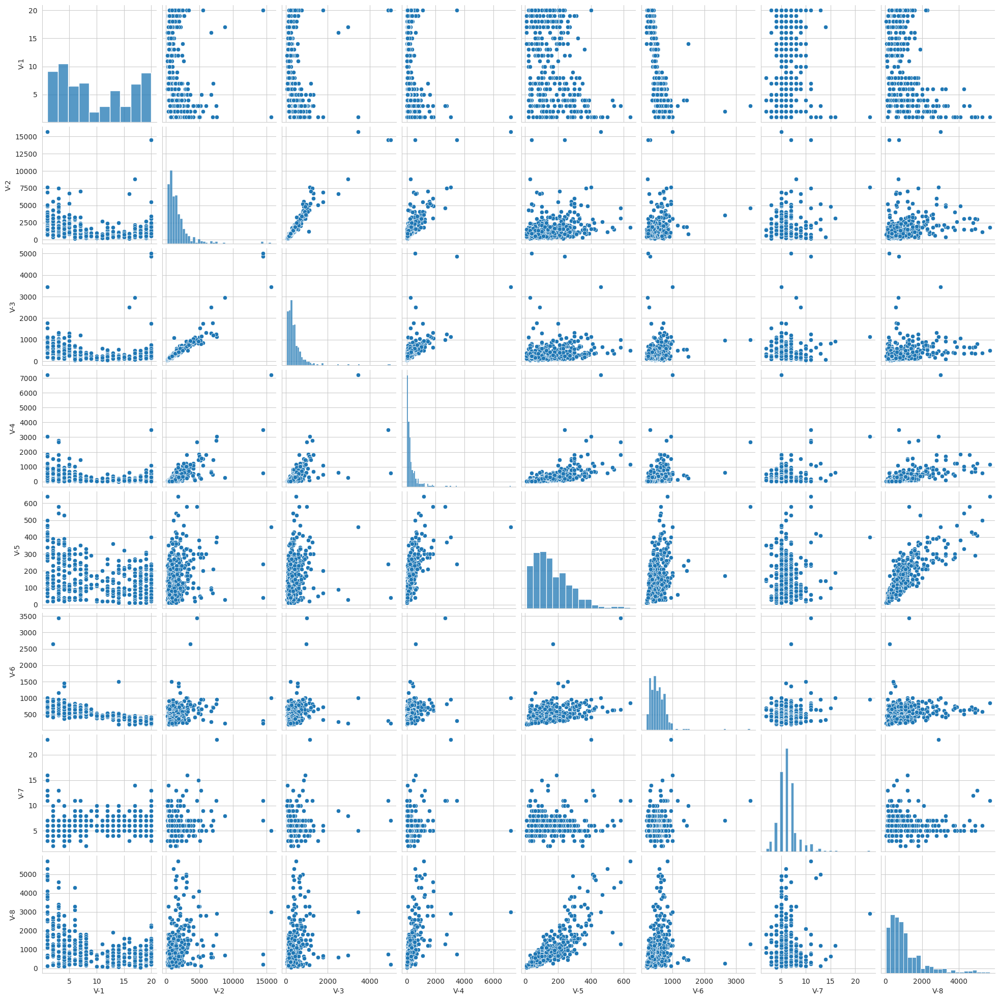

In [81]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Creación del DataFrame 'physical' con las variables seleccionadas
physical = residencial_df[['V-1', 'V-2', 'V-3', 'V-4', 'V-5', 'V-6', 'V-7', 'V-8']]

# Hacemos el pairplot con seaborn
sns.pairplot(physical)
plt.show()


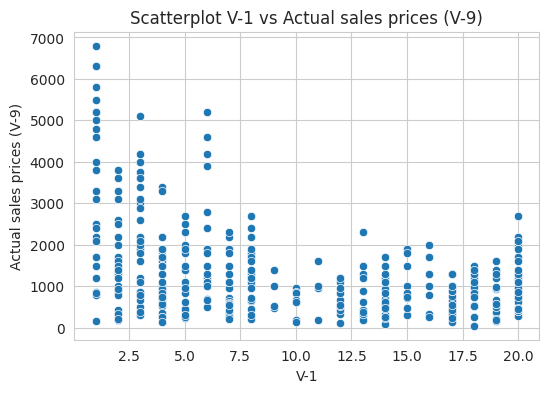

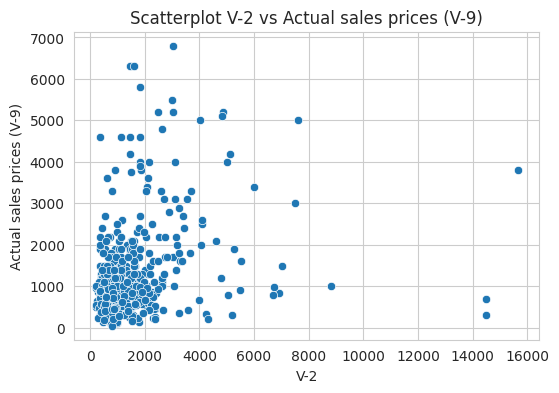

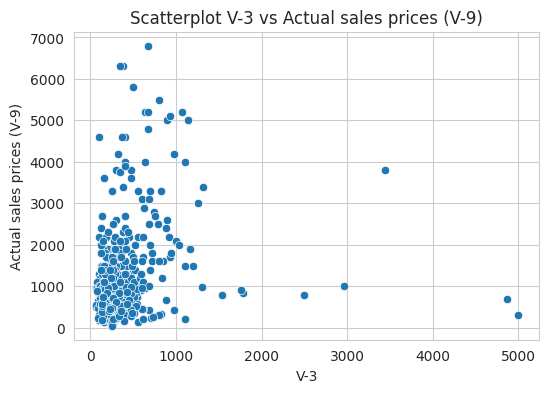

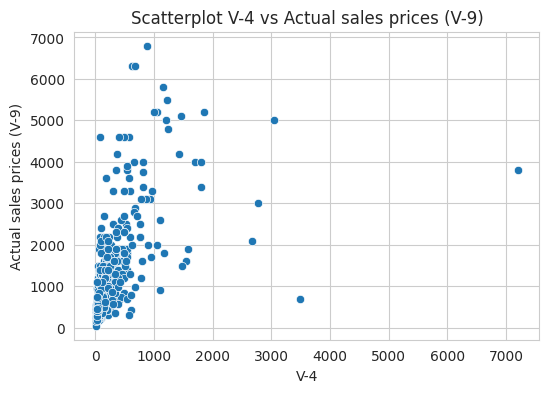

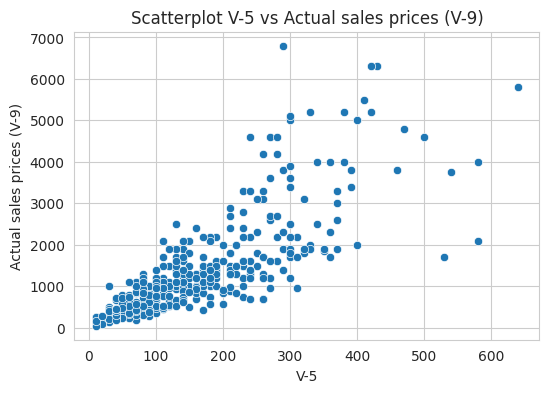

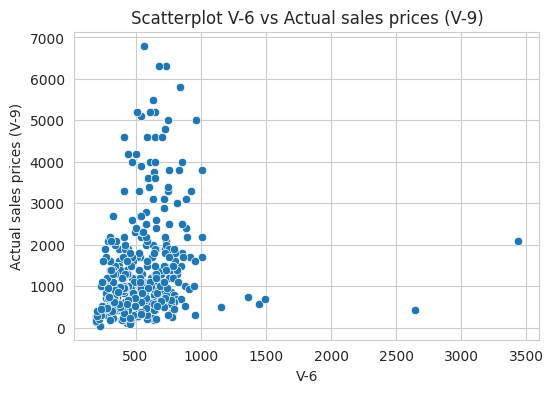

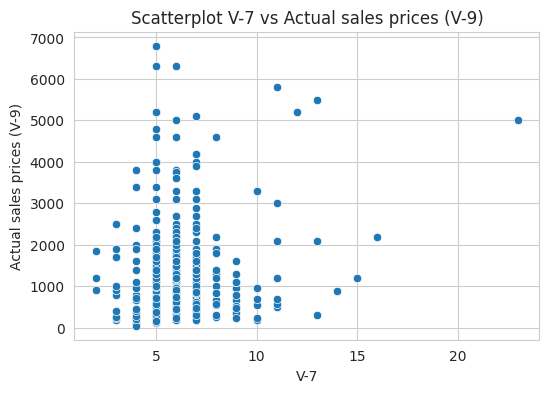

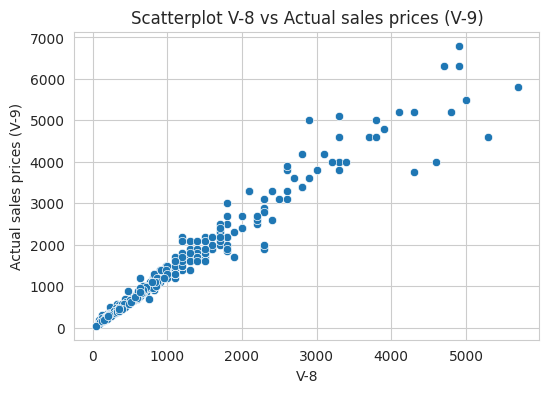

In [82]:
import seaborn as sns
import matplotlib.pyplot as plt

# Variables physical
physical = residencial_df[['V-1', 'V-2', 'V-3', 'V-4', 'V-5', 'V-6', 'V-7', 'V-8', 'V-9']]

# Creamos scatterplots de las variables físicas con respecto a V-9 (Actual sales prices)
for col in physical.columns[:-1]:  # Excluimos V-9 en el bucle
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=physical[col], y=physical['V-9'])
    plt.title(f'Scatterplot {col} vs Actual sales prices (V-9)')
    plt.xlabel(col)
    plt.ylabel('Actual sales prices (V-9)')
    plt.show()

VEMOS RELACIONES MUY CLARAS Y POSITIVAS CON V9 QUE SON LOS ACTUAL PRICES Y TAMBIEN CON V10 QUE SON LOS COST PRICES CON LAS VARIABLES V5(Preliminary estimated construction cost based on the prices at the beginning of the project) Y LA V8 (Price of the unit at the beginning of the project per m2). ALGO INTERESANTE ES QUE SE OBSERVA UNA ALTA VARIABILIDAD EN LOS PRECIOS CON RESPECTO A LA V1 QUE ES PROJECT LOCALITY PERO REALMENTE NO INFLUYE DE MANERA LINEAL Y DIRECTA.


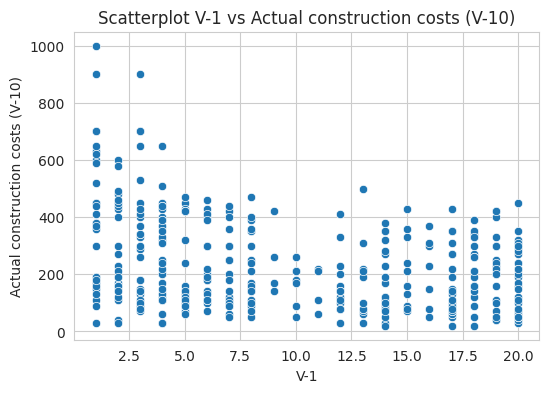

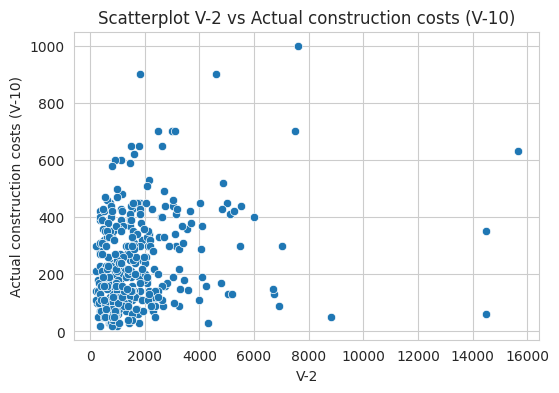

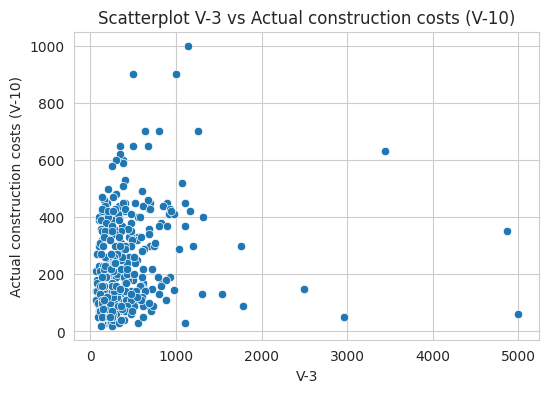

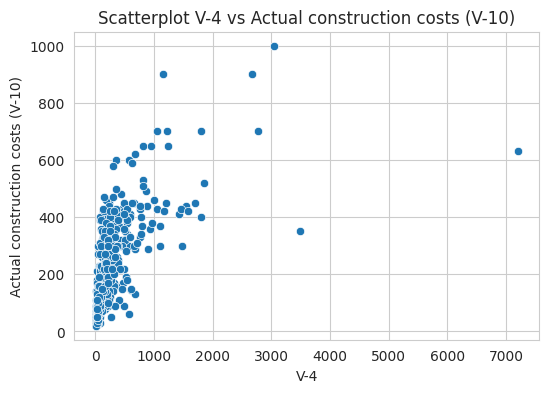

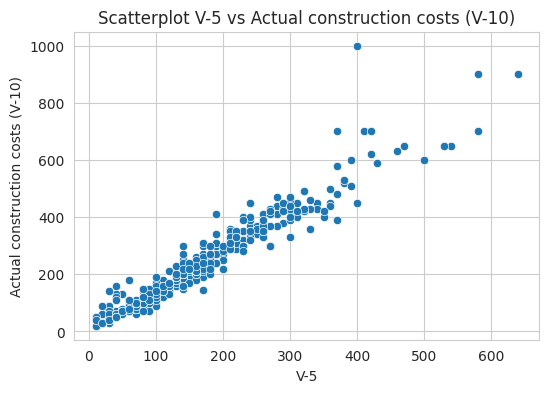

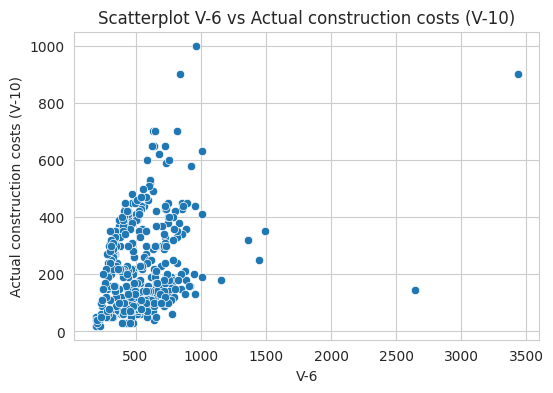

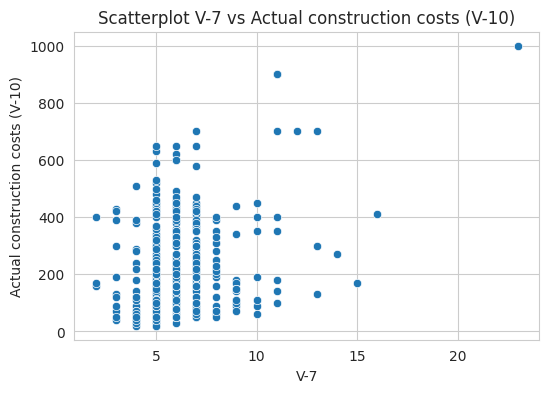

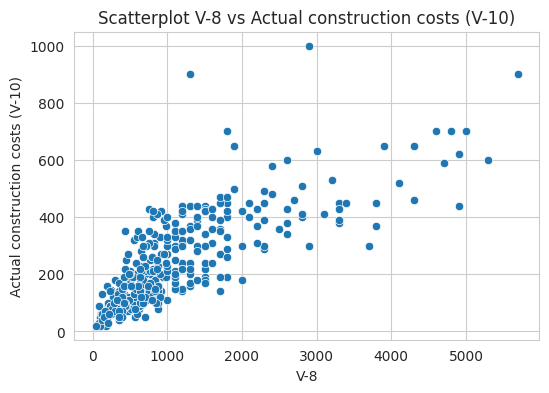

In [83]:
# Creamos scatterplots de las variables físicas con respecto a V-10 (Actual construction costs)
physical = residencial_df[['V-1', 'V-2', 'V-3', 'V-4', 'V-5', 'V-6', 'V-7', 'V-8', 'V-10']]

for col in physical.columns[:-1]:  # Excluimos V-10 en el bucle
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=physical[col], y=physical['V-10'])
    plt.title(f'Scatterplot {col} vs Actual construction costs (V-10)')
    plt.xlabel(col)
    plt.ylabel('Actual construction costs (V-10)')
    plt.show()


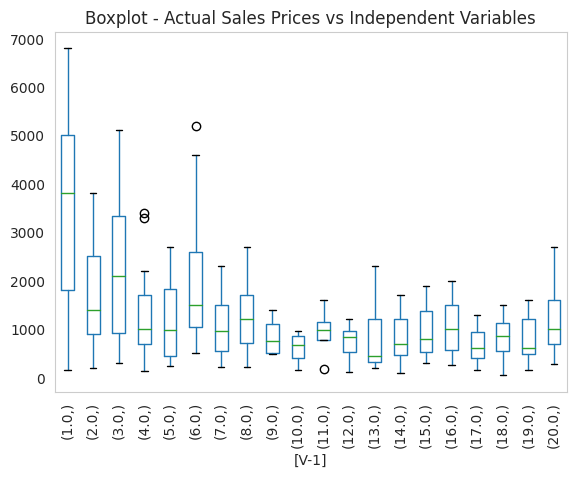

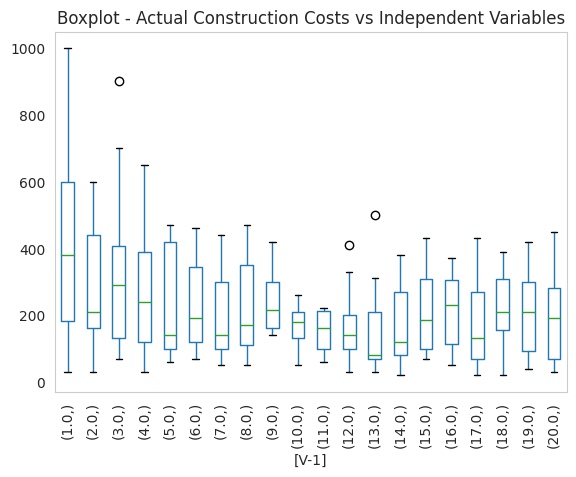

In [78]:
# Definir las variables independientes y las dependientes
physical_columns = ['V-1']
V9 = 'V-9'  # Actual sales prices (target)
V10 = 'V-10'  # Actual construction costs (target)

# Crear un boxplot para V-9 (Actual sales prices)
residencial_df.boxplot(column=V9, by=physical_columns, grid=False)
plt.title('Boxplot - Actual Sales Prices vs Independent Variables')
plt.suptitle('')
plt.xticks(rotation=90)
plt.show()

# Crear un boxplot para V-10 (Actual construction costs)
residencial_df.boxplot(column=V10, by=physical_columns, grid=False)
plt.title('Boxplot - Actual Construction Costs vs Independent Variables')
plt.suptitle('')
plt.xticks(rotation=90)
plt.show()

In [54]:
numerical_columns = residencial_df.select_dtypes(include=[np.number]).columns 

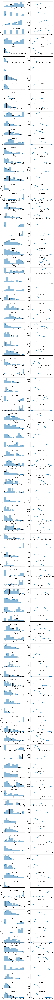

In [55]:
#estoy creando los subplots (ncols=2 columnas)
fig, axes = plt.subplots(nrows=len(numerical_columns), ncols=2, figsize=(12, 2 * len(numerical_columns)))

# Para i=0, y hasta el ultimo elemento que tenga en la columna numerica
for i, col in enumerate(numerical_columns):
    # Histogram
    sns.histplot(data=residencial_df, x=col, ax=axes[i, 0], kde=True)
    axes[i, 0].set_title(f'Histogram of {col}')

    # KDE
    sns.kdeplot(data=residencial_df, x=col, ax=axes[i, 1])
    axes[i, 1].set_title(f'KDE Plot of {col}')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

SI SE OBSERVA QUE HAY VARIABLES QUE NECESITAN SER ESCALADAS

# **Exploración y preprocesamiento de datos**

Tarea: Explorar y preprocesar los datos para identificar patrones, tendencias y relaciones significativas.

Instrucciones:

Realizar análisis exploratorio de datos (EDA) utilizando visualizaciones y estadísticas descriptivas.
Aplicar técnicas de preprocesamiento como normalización, codificación de variables categóricas y reducción de dimensionalidad.
Importancia: La exploración y el preprocesamiento permiten comprender mejor los datos y preparar un conjunto de datos optimizado para el modelado, mejorando así la calidad de los resultados.

In [56]:
residencial_df.describe().T

,count,mean,std,min,25%,50%,75%,max
START YEAR,372.0,8.148387e+01,4.182141,72.00,78.0000,82.000,85.000,88.00
START QUARTER,372.0,2.190860e+00,1.083382,1.00,1.0000,2.000,3.000,4.00
COMPLETION YEAR,372.0,8.295161e+01,4.223898,73.00,80.0000,84.000,87.000,90.00
COMPLETION QUARTER,372.0,2.586022e+00,1.123442,1.00,2.0000,3.000,4.000,4.00
V-1,372.0,9.728495e+00,6.563309,1.00,4.0000,8.000,17.000,20.00
V-2,372.0,1.729044e+03,1802.371491,200.00,720.0000,1220.000,2100.000,15670.00
V-3,372.0,4.261142e+02,490.076498,60.00,190.0000,300.000,490.500,5000.00
V-4,372.0,3.279041e+02,563.544337,3.70,67.8000,164.700,366.050,7208.20
V-5,372.0,1.631183e+02,112.604343,10.00,80.0000,140.000,230.000,640.00
V-6,372.0,5.544198e+02,275.105953,193.08,391.6775,522.455,667.905,3436.93


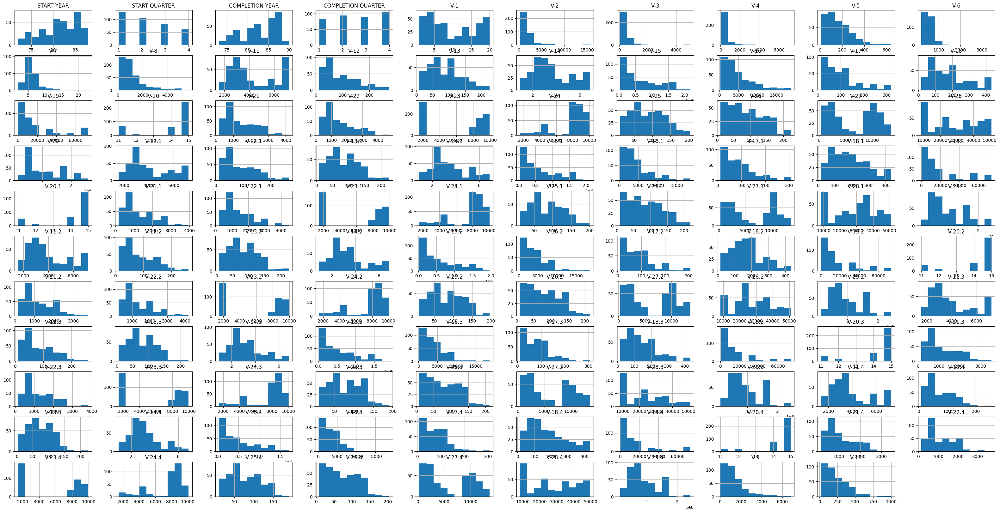

In [57]:
residencial_df[numerical_columns].hist(figsize=(40, 20))
plt.show()

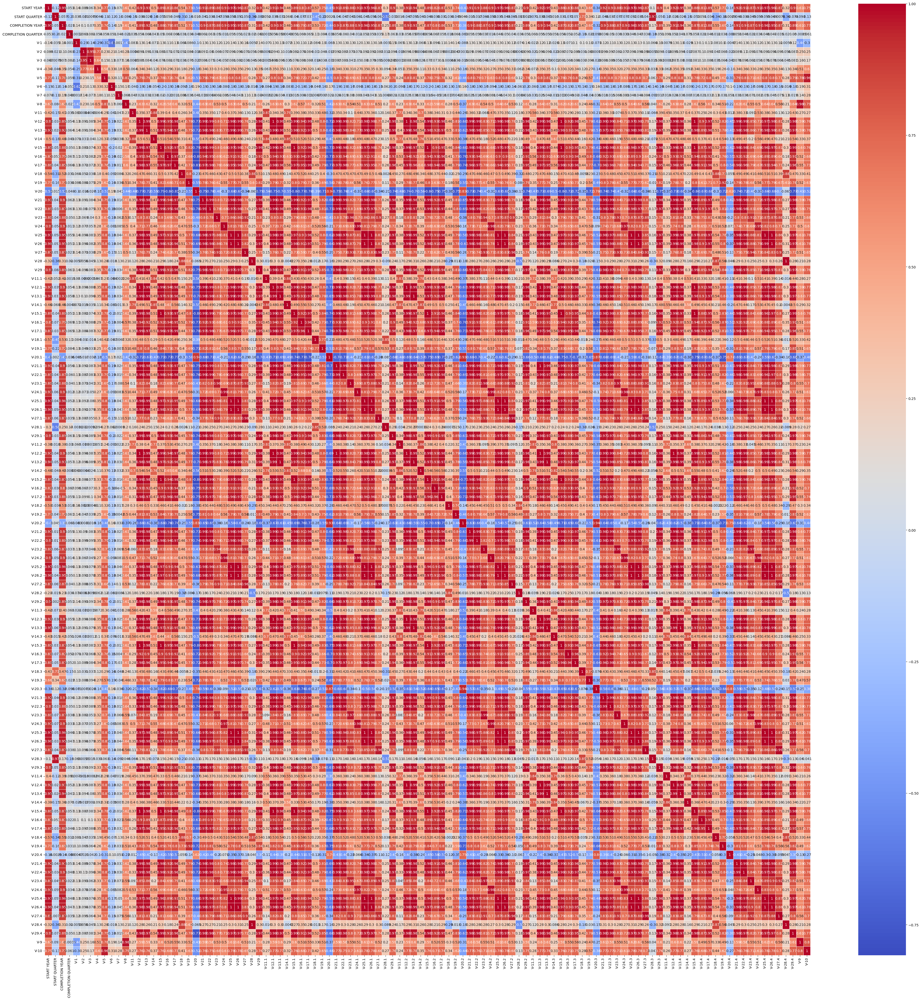

In [58]:
import seaborn as sns

# Generar el mapa de calor para la correlación
plt.figure(figsize=(50,50))
sns.heatmap(residencial_df.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.show()

In [59]:
A PARTIR DE ESTE HEAT MAP PODEMOS DARNOS CUENTA QUE HAY QUE METER UN PCA ANALISIS PARA REDUCIR DIMENSIONALIDAD Y EVITAR OVERFITTING ADEMÁS DE QUE ESTA IMPOSIBLE ANALIZAR LAS VARIABLES CUANDO SON TANTAS POR LO QUE HAREMOS UNOS HEATMAPS POR LAS VARIABLES FISICAS Y LUEGO LAS VARIABLES ECONOMICAS PARA VER COMO SE OBSERVAN LAS CORRELACIONES, DEJAREMOS LOS LAGS DE LADO POR EL MOMENTO

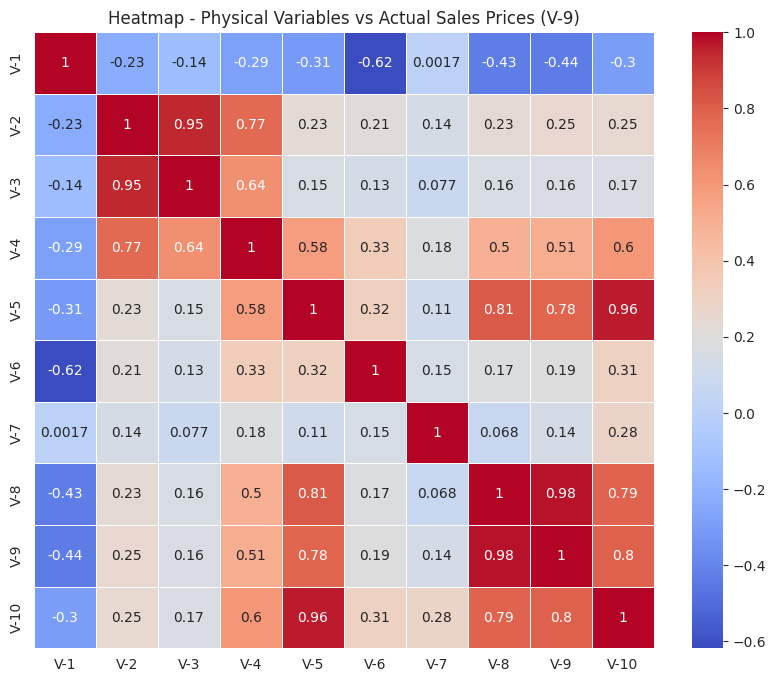

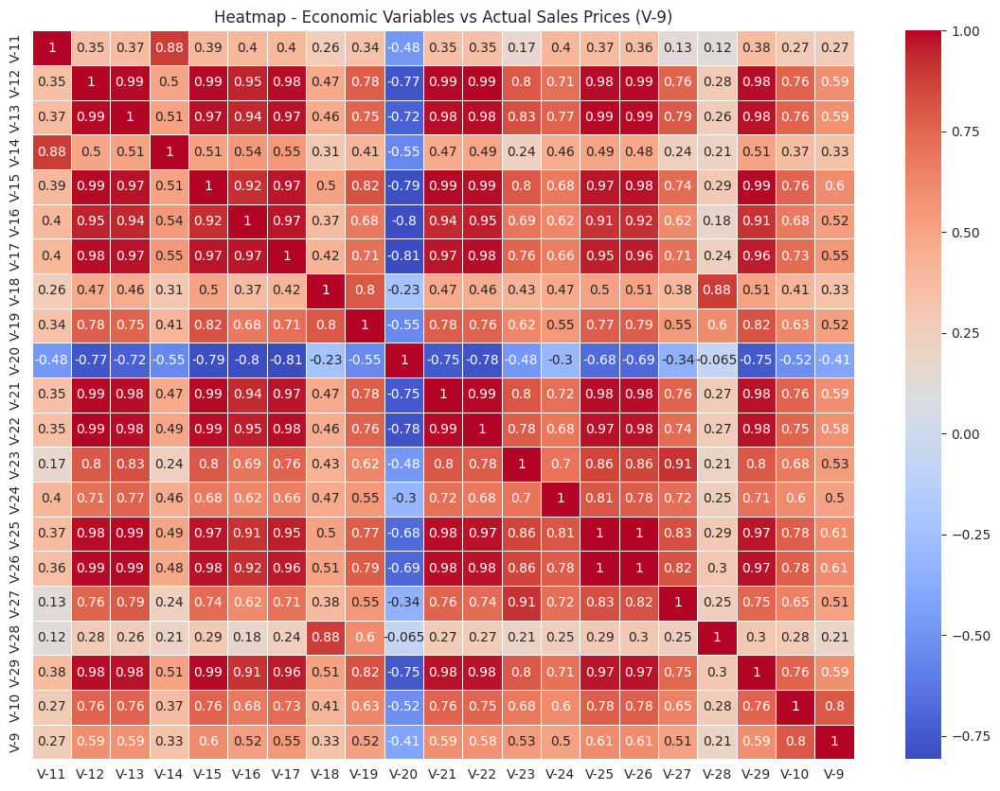

In [84]:
import seaborn as sns
import matplotlib.pyplot as plt

#Variables físicas
physical_variables = residencial_df[['V-1', 'V-2', 'V-3', 'V-4', 'V-5', 'V-6', 'V-7', 'V-8', 'V-9', 'V-10']]
correlation_physical = physical_variables.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_physical, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap - Physical Variables vs Actual Sales Prices (V-9)')
plt.show()

# Filtramos las variables económicas
economic_variables = residencial_df[['V-11', 'V-12', 'V-13', 'V-14', 'V-15', 'V-16', 'V-17', 'V-18', 'V-19', 'V-20', 'V-21', 'V-22', 'V-23', 'V-24', 'V-25', 'V-26', 'V-27', 'V-28', 'V-29', 'V-10','V-9']]
correlation_economic = economic_variables.corr()

plt.figure(figsize=(14, 10))
sns.heatmap(correlation_economic, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap - Economic Variables vs Actual Sales Prices (V-9)')
plt.show()


PHYSICAL VARIABLES:

El heatmap muestra una fuerte correlación entre V-9 (Actual sales prices) y V-10 (Actual construction costs), con un valor de 0.80 por lo que en la medida que aumentan los costos reales aumentan los precios de venta también. Lo cual es de esperarse costos altos hacen un precio alto.

Adicionalmente, las variables con mayor influencia en V-9 (precios de venta) son el precio por metro cuadrado al inicio del proyecto (V-8), con una correlación muy alta (0.98), y los costos preliminares de construcción (V-5), con una correlación de 0.78. Lo que significa que los costos que estimaste como los costos finales pues estan relacionaos con el precio y costo final.

Interesante que la localización del proyecto (V-1) tiene una correlación negativa con los precios de venta (-0.44), lo que sugiere que ciertos códigos postales pueden estar asociados con precios de venta más bajos pero tambien vemos en el scatterplot que pues no estan tan relacionados un zipcode puede tener precios bajos y altos lo cual puede explicar esta correlación.

ECONOMICAL VARIABLES E INDICES

Analizaremos solo el v9 ya que vimos que v9 y v10 estan altamente correlaciondos.
Vemos correlaciones FUERTES OTRA VEZ DE LOS COSTOS: V-22 (Average construction cost at the beginning of construction de 0.78), V-21 (Average construction cost at completion) también muestra una correlación alta (0.80), V-16 (Private sector investment in new buildings) muestra una correlación significativa (0.71) esto podria ser porque mas inversiones, precios de venta mas altos, esta esta interesante. V-25 (Consumer price index - CPI) y V-26 (CPI of housing, water, fuel & power) tienen correlaciones medianas de 0.59 y 0.61, lo que significa que los precios y variables macroeconomicas tienen influencia en precios mas altos, la segunda es obvia porque incluye precio de housing por lo que es logico que influira pero significa que quizas el precio del "fuel"y "power bajan un poco la correlación.

Y vemos correlaciones negativas: V-19 (Amount of loans extended by banks)  (-0.34) por lo que mientras mas LOANS hay menos precios que es logico porque pues es oferta y demanda, si hay mucha oferta bajan los precios. La tasa de interes tambien porque es lo que te permite financiarte por lo que es mas logico tambien V-20 (Interest rate for loans) muestra una correlación negativa moderada (-0.52)

Vemos relaciones fuertes entre V-12 (Building services index - BSI) y V-13 (Wholesale price index - WPI), con valores cercanos a 1.0. Definitivamente hay multicolinealidad en esta base de datos por lo que esto tambien nos da justificación para un PCA.

# **Versionado de datos**

Tarea: Aplicar técnicas de versionado de datos para asegurar reproducibilidad y trazabilidad.

Instrucciones:

Utilizar herramientas de versionado de datos para mantener un registro de cambios y versiones de los conjuntos de datos utilizados.
Documentar todas las modificaciones realizadas en los datos.
Importancia: El versionado de datos es esencial para la reproducibilidad de los experimentos y para mantener un historial detallado del manejo de los datos.

In [60]:
#!git clone https://{tu_token_de_github}@github.com/{tu_usuario}/Fase_1.git

In [61]:
"""
# Añadir los cambios
!git add .

# Hacer un commit con un mensaje descriptivo
!git commit -m "Ajustes en la fase de preprocesamiento y modelo ML"

# Subir los cambios al repositorio en GitHub
!git push
"""

'\n# Añadir los cambios\n!git add .\n\n# Hacer un commit con un mensaje descriptivo\n!git commit -m "Ajustes en la fase de preprocesamiento y modelo ML"\n\n# Subir los cambios al repositorio en GitHub\n!git push\n'

***MLFOW UTILIZAR***

In [62]:
"""

MLFLOW DE LOS PROFESORES
import mlflow

from sklearn.model_selection import train_test_split
from sklearn.datasets import load_diabetes
from sklearn.ensemble import RandomForestRegressor

mlflow.set_tracking_uri("http://localhost:5000")
mlflow.set_experiment(f"/user/test")


with mlflow.start_run() as run:
    # Load the diabetes dataset.
    db = load_diabetes()
    X_train, X_test, y_train, y_test = train_test_split(db.data, db.target)

    # Create and train models.
    rf = RandomForestRegressor(n_estimators=100, max_depth=6, max_features=3)
    rf.fit(X_train, y_train)

    # Use the model to make predictions on the test dataset.
    predictions = rf.predict(X_test)

    mlflow.sklearn.log_model(rf, "model")

    print("Run ID: {}".format(run.info.run_id))

"""

'\n\nMLFLOW DE LOS PROFESORES\nimport mlflow\n\nfrom sklearn.model_selection import train_test_split\nfrom sklearn.datasets import load_diabetes\nfrom sklearn.ensemble import RandomForestRegressor\n\nmlflow.set_tracking_uri("http://localhost:5000")\nmlflow.set_experiment(f"/user/test")\n\n\nwith mlflow.start_run() as run:\n    # Load the diabetes dataset.\n    db = load_diabetes()\n    X_train, X_test, y_train, y_test = train_test_split(db.data, db.target)\n\n    # Create and train models.\n    rf = RandomForestRegressor(n_estimators=100, max_depth=6, max_features=3)\n    rf.fit(X_train, y_train)\n\n    # Use the model to make predictions on the test dataset.\n    predictions = rf.predict(X_test)\n\n    mlflow.sklearn.log_model(rf, "model")\n\n    print("Run ID: {}".format(run.info.run_id))\n\n'

# **Construcción, ajuste y evaluación de Modelos de Machine Learning**

Tarea: Construir, ajustar y evaluar modelos de Machine Learning utilizando técnicas y algoritmos apropiados.

Instrucciones:

Seleccionar algoritmos de Machine Learning adecuados para resolver el problema planteado.
Entrenar los modelos utilizando los datos preprocesados.
Realizar ajustes de hiperparámetros para optimizar el rendimiento del modelo.
Evaluar los modelos utilizando métricas de rendimiento específicas.
Importancia: Esta etapa es fundamental para desarrollar modelos precisos y eficientes que puedan resolver problemas específicos de manera efectiva.

El componente principal 1 explica el 65.13% de la varianza.
El componente principal 2 explica el 6.90% de la varianza.
El componente principal 3 explica el 4.74% de la varianza.
El componente principal 4 explica el 4.49% de la varianza.
El componente principal 5 explica el 3.07% de la varianza.
El componente principal 6 explica el 2.89% de la varianza.
El componente principal 7 explica el 1.91% de la varianza.
El componente principal 8 explica el 1.54% de la varianza.
El componente principal 9 explica el 1.44% de la varianza.
El componente principal 10 explica el 1.06% de la varianza.
El componente principal 11 explica el 0.91% de la varianza.
El componente principal 12 explica el 0.88% de la varianza.
El componente principal 13 explica el 0.78% de la varianza.
El componente principal 14 explica el 0.59% de la varianza.
El componente principal 15 explica el 0.49% de la varianza.
El componente principal 16 explica el 0.43% de la varianza.
El componente principal 17 explica el 0.31% de l

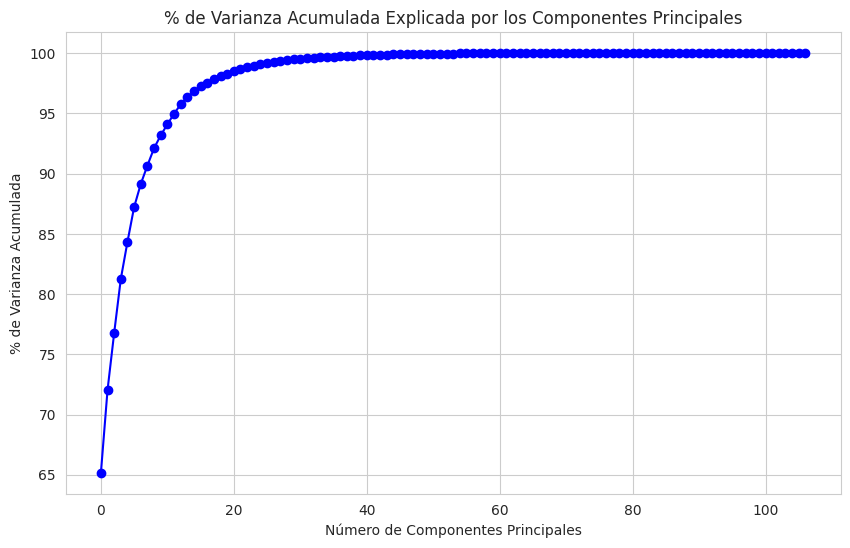

Cargas de cada componente principal:
    START YEAR  START QUARTER  COMPLETION YEAR  COMPLETION QUARTER       V-1  \
0     0.113502      -0.006943         0.112124            0.006423  0.014830   
1    -0.055541      -0.002275        -0.060306            0.013549 -0.002576   
2     0.065028      -0.288333         0.053598            0.041215 -0.040013   
3     0.103709       0.105487         0.114440           -0.036713  0.034647   
4     0.017364      -0.336901        -0.011051            0.143640 -0.100958   
5    -0.017502       0.105127         0.001732            0.001852 -0.344935   
6     0.014871       0.043459         0.016450            0.023642 -0.111284   
7     0.010791      -0.161407         0.012035            0.120362  0.259634   
8     0.006617       0.079296        -0.001168            0.100693  0.391710   
9    -0.012755       0.047103         0.031443           -0.007800 -0.018577   
10   -0.009280       0.042123         0.042344            0.538130  0.121019   
11 

In [75]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Nuestras variables V1 a V29 son las variables independientes con sus 5 lags  y V9, V10 son las variables dependientes
X = residencial_df.iloc[:, :-2]  # Todas las columnas excepto las dos últimas (variables dependientes)
Y = residencial_df.iloc[:, -2:]  # Últimas dos columnas como variables dependientes (V9 (Price) y V10(Cost))

# Escalado de los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Aplicamos PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Analizamos la varianza explicada por los componentes principales
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

# Seleccionamos el número óptimo de componentes (por ejemplo, los que expliquen el 99% de la varianza)
n_components = next(i for i, cum_var in enumerate(cumulative_variance) if cum_var >= 0.99)

# Aplicamos PCA con el número óptimo de componentes
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)


import matplotlib.pyplot as plt
import seaborn as sns

# Visualizamos la varianza explicada por cada componente
for i, var in enumerate(explained_variance):
    print(f"El componente principal {i+1} explica el {var * 100:.2f}% de la varianza.")

# Graficamos la varianza acumulada explicada
sns.set_style('whitegrid')
plt.figure(figsize=(10, 6))
plt.plot(cumulative_variance * 100, marker='o', linestyle='-', color='b')

# Añadimos etiquetas y títulos
plt.title('% de Varianza Acumulada Explicada por los Componentes Principales')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('% de Varianza Acumulada')
plt.grid(True)

# Mostrar el gráfico
plt.show()


# Obtenemos los coeficientes (cargas) de cada componente principal
loadings = pd.DataFrame(pca.components_, columns=X.columns)

# Mostramos los coeficientes
print("Cargas de cada componente principal:")
print(loadings)

# Si quieres ver la relación de cada componente con las variables originales
for i, component in enumerate(loadings.values):
    print(f"\nComponente Principal {i+1}:")
    for name, coef in zip(X.columns, component):
        print(f"{name}: {coef:.4f}")


OBSERVAMOS QUE EL PRIMER COMPONENTE PRINCIPAL EXPLICA EL 65% DE LA VARIANZA Y ANALIZAMOS ALGUNAS DE LAS CARGAS PRINCIPALES EN ESTAS VARIABLES- 24 COMPONENTES EXPLICAN EL 99% DE NUESTRA VARIANZA
* V-25 (Consumer price index - CPI): 0.1193
* V-26 (CPI of housing, water, fuel & power): 0.1195
* V-21 (Average construction cost by private sector at completion): 0.1182
* V-22 (Average construction cost at the beginning of construction): 0.1177
* V-12 (Building services index - BSI): 0.1187
* V-13 (Wholesale price index - WPI): 0.1188
* V-29 (Gold price): 0.1170
* V-15 (Cumulative liquidity): 0.1178
* V-17 (Land price index): 0.1162

In [76]:
# AHORA SI YA CON EL ESCALAMIENTO PODEMOS HACER EL MODELO DE ML

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, Y_train, Y_test = train_test_split(X_pca, Y, test_size=0.25, random_state=42)

# ========================================
# 1. Aplicar Regresión Lineal
# ========================================
# Inicializamos el modelo de regresión lineal
lin_reg = LinearRegression()

# Entrenamos el modelo con el conjunto de entrenamiento
lin_reg.fit(X_train, Y_train)

# Hacemos predicciones sobre el conjunto de prueba
Y_pred_lin = lin_reg.predict(X_test)

# Evaluamos el modelo de regresión lineal
print("Linear Regression Results:")
print(f"R2 Score: {r2_score(Y_test, Y_pred_lin)}")
print(f"Mean Squared Error: {mean_squared_error(Y_test, Y_pred_lin)}\n")

# ========================================
# 2. Aplicar Random Forest
# ========================================
# Inicializamos el modelo de Random Forest
rf_reg = RandomForestRegressor(random_state=42)

# Entrenamos el modelo con el conjunto de entrenamiento
rf_reg.fit(X_train, Y_train)

# Hacemos predicciones sobre el conjunto de prueba
Y_pred_rf = rf_reg.predict(X_test)

# Evaluamos el modelo de Random Forest
print("Random Forest Results:")
print(f"R2 Score: {r2_score(Y_test, Y_pred_rf)}")
print(f"Mean Squared Error: {mean_squared_error(Y_test, Y_pred_rf)}")


Linear Regression Results:
R2 Score: 0.9610858806614759
Mean Squared Error: 23608.662510002036

Random Forest Results:
R2 Score: 0.8879655983066308
Mean Squared Error: 95543.46916666665


In [77]:
# Evaluamos el modelo de Regresión Lineal en el conjunto de entrenamiento
Y_train_pred_lin = lin_reg.predict(X_train)
train_r2_lin = r2_score(Y_train, Y_train_pred_lin)
train_mse_lin = mean_squared_error(Y_train, Y_train_pred_lin)

# Evaluamos el modelo de Random Forest en el conjunto de entrenamiento
Y_train_pred_rf = rf_reg.predict(X_train)
train_r2_rf = r2_score(Y_train, Y_train_pred_rf)
train_mse_rf = mean_squared_error(Y_train, Y_train_pred_rf)

# Mostramos los resultados para el conjunto de entrenamiento
print("Linear Regression - Training Results:")
print(f"R2 Score (Train): {train_r2_lin}")
print(f"Mean Squared Error (Train): {train_mse_lin}\n")

print("Random Forest - Training Results:")
print(f"R2 Score (Train): {train_r2_rf}")
print(f"Mean Squared Error (Train): {train_mse_rf}\n")

# Los resultados del conjunto de prueba ya los tenemos, pero los mostramos aquí de nuevo para compararlos
print("Linear Regression - Test Results:")
print(f"R2 Score (Test): {r2_score(Y_test, Y_pred_lin)}")
print(f"Mean Squared Error (Test): {mean_squared_error(Y_test, Y_pred_lin)}\n")

print("Random Forest - Test Results:")
print(f"R2 Score (Test): {r2_score(Y_test, Y_pred_rf)}")
print(f"Mean Squared Error (Test): {mean_squared_error(Y_test, Y_pred_rf)}")


Linear Regression - Training Results:
R2 Score (Train): 0.9565567514955744
Mean Squared Error (Train): 17208.60676794488

Random Forest - Training Results:
R2 Score (Train): 0.9679370806993699
Mean Squared Error (Train): 15485.995510752693

Linear Regression - Test Results:
R2 Score (Test): 0.9610858806614759
Mean Squared Error (Test): 23608.662510002036

Random Forest - Test Results:
R2 Score (Test): 0.8879655983066308
Mean Squared Error (Test): 95543.46916666665


Observamos los resultados del conjunto de prueba vs el conjunto de entrenamiento para y vemos que para LINEAR REGRESSION el r2 es practicamente igual entrenamiento (0.9566)vs prueba (0.9611), lo que indica que el modelo no muestra signos de overfitting. Además lo vemos en el error cuadrático medio (MSE) es ligeramente mayor en el conjunto de prueba (23,608) vs el de entrenamiento (17,208) pero no parece muy grande la diferencia.  

Por otro lado, el nuestro modelo de Random Forest muestra una diferencia más notable entre el r² del entrenamiento (0.9679) vs prueba (0.8879). Y el error si es mucho mayor por lo que en el conjunto de prueba (95,543) vs el de entrenamiento (15,486) por lo que este modelo si podría estar sufriendo overfitting

# **Aplicación de Mejores Prácticas en el Pipeline de Modelado**

Tarea: Aplicar mejores prácticas en cada etapa del pipeline de modelado.

Instrucciones:

Implementar pipelines de Machine Learning en donde se automaticen las tareas de preprocesamiento, entrenamiento y evaluación.
Documentar cada paso del pipeline para asegurar claridad y reproducibilidad.
Importancia: Las mejores prácticas garantizan que el proceso de modelado sea eficiente, reproducible y escalable.

In [80]:
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score

#Dividimos los datos en entrenamiento y prueba
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=42)

#Pipeline para Linear Regression
pipeline_lr = Pipeline(steps=[
    ('scaler', StandardScaler()),  # Estandarización de las variables
    ('pca', PCA(n_components=24)),  # PCA con n_components seleccionados
    ('regression', LinearRegression())  # Regresión Lineal
])

#Pipeline para RF
pipeline_rf = Pipeline(steps=[
    ('scaler', StandardScaler()),  # Estandarización de las variables
    ('pca', PCA(n_components=8)),  # PCA con n_components seleccionados
    ('random_forest', RandomForestRegressor(random_state=42))  # Random Forest
])

# Entrenamiento y evaluacion LR
pipeline_lr.fit(X_train, Y_train)

# Pedicciones y con conjunto de prueba
Y_pred_lr = pipeline_lr.predict(X_test)

# Metricas LR
print("Linear Regression Pipeline:")
print(f"R2 Score: {r2_score(Y_test, Y_pred_lr)}")
print(f"Mean Squared Error: {mean_squared_error(Y_test, Y_pred_lr)}\n")

# Entrenamiento y evaluacion RF
pipeline_rf.fit(X_train, Y_train)

# Pedicciones y con conjunto de prueba RF
Y_pred_rf = pipeline_rf.predict(X_test)

# Métricas RF
print("Random Forest Pipeline:")
print(f"R2 Score: {r2_score(Y_test, Y_pred_rf)}")
print(f"Mean Squared Error: {mean_squared_error(Y_test, Y_pred_rf)}\n")

#Cross-validation para asegurar la reproducibilidad y robustez
cv_scores_lr = cross_val_score(pipeline_lr, X, Y, cv=5, scoring='r2')
cv_scores_rf = cross_val_score(pipeline_rf, X, Y, cv=5, scoring='r2')

print("Cross-Validation Linear Regression R² Scores:", cv_scores_lr)
print("Cross-Validation Random Forest R² Scores:", cv_scores_rf)


Linear Regression Pipeline:
R2 Score: 0.9613143477281604
Mean Squared Error: 23256.17513794565

Random Forest Pipeline:
R2 Score: 0.799556825831918
Mean Squared Error: 285872.945672043

Cross-Validation Linear Regression R² Scores: [0.90131045 0.94458456 0.95570183 0.93263674 0.81515736]
Cross-Validation Random Forest R² Scores: [ 0.54953508  0.72639601  0.75644218  0.60498732 -0.33529964]


# **Estructuración y Refactorización del Código**

Tarea: Estructurar modelos de Machine Learning de manera organizada y aplicar principios de programación orientada a objetos.

Instrucciones:

Organizar el código en módulos y funciones bien definidas.
Aplicar principios de programación orientada a objetos para mejorar la estructura del código.
Refactorizar el código existente para mejorar su eficiencia y mantenibilidad.
Importancia: Una buena estructuración y refactorización del código es esencial para el mantenimiento a largo plazo y la escalabilidad de los proyectos de Machine Learning.

**Se deben referenciar a repositorios de github mostrando actividad de parte de todos los integrantes del equipo.**

**Entregar presentación ejecutiva de esta fase en PDF.**

**Video en equipo (5-10 min) con explicación del trabajo realizado en la fase, siguiendo como referencia la rúbrica de evaluación, incluyendo el link de este video en el documento PDF.**